# Combining grid-offset shift and fully-redundant-FOV removal (LT066_sample_01)

Continues two independent investigations, both built on
`decrease_fov_number/02_tighten_boundary_and_reduce_fov_count.ipynb`'s tuned
boundary and fresh production-pipeline grid (1127 FOVs):

- `03_sweep_grid_offset_for_fov_reduction.ipynb` -- shifting the grid's phase
  can drop FOVs for free (zero tissue coverage lost); best clean single-axis
  offset found: `dx=+20` um -> 1119 FOVs (-8 vs. baseline).
- `04_find_fully_redundant_fovs.ipynb` -- some FOVs are "fully redundant"
  (their entire tissue overlap is already covered by other kept FOVs) and can
  be dropped regardless of grid phase; on the baseline (dx=0) grid, 41 / 1127
  FOVs (3.6%) qualify, safely removable together -> 1086 FOVs.

The two methods act at different stages -- offset changes *which* grid points
exist before filtering; redundant-FOV removal is a post-hoc property check
applicable to *any* resulting grid -- so there's no structural reason they
should conflict. This notebook checks that directly: build the best-offset
grid, re-run the fully-redundant-FOV check *on that grid* (its redundant set
isn't the same 41 FOVs -- it's a different grid), remove what's safe, and
verify the combined result still leaves zero tissue uncovered. Then compares
the real production-equivalent grid (offset=0, no redundant removal) against
the combined-method grid.

## 1 — Setup

In [1]:
import os
import sys
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import box as shapely_box
from shapely.ops import unary_union
from shapely.strtree import STRtree

# notebooks/tests/<subfolder>/ is three levels under the repo root (MERci/),
# same convention as notebooks/before_imaging/regular/ (3 levels).
MERCI_DIR = Path(os.getcwd()).parent.parent.parent
sys.path.insert(0, str(MERCI_DIR / "src"))

from MERci.acquisition.positions import (
    load_boundary_polygon, load_hole_polygons_all_sources, resolve_boundaries_source_dir,
    create_grid_positions, generate_scanning_path, filter_scanning_path, close_scanning_path,
)
from MERci.acquisition.configs import get_fov_geometry
from MERci.acquisition.mosaic import load_or_build_mosaic_canvas_cached, segment_mosaic_tissue
from MERci.visualization import get_merci_figures_dir

NOTEBOOK_NAME = "combine_offset_and_redundant_removal"

PLOT_TITLE_FONTSIZE, PLOT_LABEL_FONTSIZE = 13, 11
PLOT_TICK_FONTSIZE, PLOT_LEGEND_FONTSIZE = 10, 10

get_ipython().run_line_magic('matplotlib', 'widget')

## 2 — Parameters

In [2]:
# Same real dataset as notebooks 01-04 -- see those notebooks' own Parameters
# cells for why SAMPLE_DIR is set explicitly rather than auto-detected.
SAMPLE_DIR = Path("/n/holylfs05/LABS/zhuang_lab/Lab/shared/projects/lineage_tracing/experiments/LT066_sample_01/merfish")

CACHE_DIR = SAMPLE_DIR / "analysis" / "cache" / NOTEBOOK_NAME
CACHE_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR = get_merci_figures_dir(SAMPLE_DIR, "tests", NOTEBOOK_NAME, subfolder="decrease_fov_number")

# Best clean (gap-free) single-axis offset found by notebook 03's sweep.
BEST_OFFSET_DX, BEST_OFFSET_DY = 20.0, 0.0

REDUNDANT_AREA_EPS_UM2 = 1.0  # same noise floor as notebook 04
GAP_AREA_EPS_UM2 = 1.0        # same noise floor as notebook 03

## 3 — Rebuild the tightened (tuned) boundary

Same real production boundary/holes and `TUNED_PARAMS` as notebooks 02-04 --
reproduced here independently since this notebook doesn't load their caches.

In [3]:
boundary_dir, boundary_src = resolve_boundaries_source_dir(SAMPLE_DIR / "positions")
boundary_polygon = load_boundary_polygon(boundary_dir / "boundary_positions.txt")
hole_polygons = load_hole_polygons_all_sources(SAMPLE_DIR / "positions", boundary_dir)

# ST2, 60X objective -- see notebook 01's own section 3 cell for how this was verified.
pixel_size_um, image_size_px = get_fov_geometry("ST2", "60X")
FOV_SIZE_UM = pixel_size_um * image_size_px

# Measured directly from two consecutive same-column real positions (see notebook 01) --
# same value used throughout notebooks 01-04.
STEP_SIZE_UM = 182.06208

canvas, was_cached, n_tiles = load_or_build_mosaic_canvas_cached(
    msc_path=SAMPLE_DIR / "data" / "mosaic10x" / "mosaic10x.msc",
    keep_objectives=["10x"], working_pixel_um=5.0, cache_dir=CACHE_DIR,
)
print(f"canvas shape={canvas.image.shape}  was_cached={was_cached}  n_tiles={n_tiles}")

def um_to_px(x, y):
    return ((np.asarray(x) - canvas.origin_um[0]) / canvas.pixel_size_um,
             (np.asarray(y) - canvas.origin_um[1]) / canvas.pixel_size_um)

half = FOV_SIZE_UM / 2.0
half_px = half / canvas.pixel_size_um

# Same TUNED_PARAMS as 02_tighten_boundary_and_reduce_fov_count.ipynb's own section 4.
MIN_HOLE_AREA_UM2_ONE_FOV = FOV_SIZE_UM ** 2
TUNED_PARAMS = dict(
    threshold=400.0, smooth_sigma_um=10.0,
    close_radius_um=10.0, open_radius_um=5.0,
    margin_um=0.0,
    min_tissue_area_um2=100_000.0,
    min_hole_area_um2=MIN_HOLE_AREA_UM2_ONE_FOV,
    min_island_area_um2=2_000.0,
    simplify_tol_um=3.0,
)
tuned_seg = segment_mosaic_tissue(canvas, **TUNED_PARAMS)
assert len(tuned_seg.tissue_polygons) == 1, "this notebook assumes a single tuned tissue piece"
tuned_boundary_polygon = tuned_seg.tissue_polygons[0]
tuned_hole_polygons = tuned_seg.hole_polygons
tuned_effective_tissue = (
    tuned_boundary_polygon.difference(unary_union(tuned_hole_polygons))
    if tuned_hole_polygons else tuned_boundary_polygon
)
print(f"tuned tissue area: {tuned_boundary_polygon.area/1e6:.2f} mm^2  "
      f"({len(tuned_hole_polygons)} holes)  effective: {tuned_effective_tissue.area/1e6:.2f} mm^2")

load_steve_mosaic: '10x' tiles (49) shifted by (x=+375.00, y=+400.00) um [.msc-recorded]
load_steve_mosaic: '60x' tiles (18) shifted by (x=+0.00, y=+0.00) um [.msc-recorded]


canvas shape=(1839, 1840)  was_cached=False  n_tiles=49


tuned tissue area: 34.42 mm^2  (9 holes)  effective: 29.74 mm^2


## 4 — Build a grid at any offset (production-pipeline internals, offset exposed)

Same three-function chain `build_boundary_path` wraps
(`create_grid_positions` -> `generate_scanning_path` -> `filter_scanning_path`),
plus the same `close_scanning_path(return_side="top")` step
`build_boundary_path` itself applies -- so `build_grid(0, 0)` reproduces the
*exact* real production grid (matches notebook 02/04's 1127-FOV, "top"-closed
numbering), and any other `(dx, dy)` is the same pipeline run at a shifted
phase.

In [4]:
def build_grid(dx, dy):
    grid, xs, ys = create_grid_positions(tuned_boundary_polygon, STEP_SIZE_UM,
                                          direction="vertical", offset=(dx, dy))
    path = generate_scanning_path(grid, direction="vertical")
    coords = filter_scanning_path(path, tuned_boundary_polygon, tuned_hole_polygons, FOV_SIZE_UM)
    if len(coords) > 1:
        coords, _ = close_scanning_path(coords, STEP_SIZE_UM, return_side="top")
    return coords

def tissue_covered_pct(coords, tissue):
    covered = unary_union([shapely_box(x - half, y - half, x + half, y + half) for x, y in coords]) \
        if len(coords) else None
    return 100 * covered.intersection(tissue).area / tissue.area if covered is not None else 0.0

production_coords = build_grid(0.0, 0.0)
offset_coords = build_grid(BEST_OFFSET_DX, BEST_OFFSET_DY)

print(f"production grid (dx=0, dy=0)              : {len(production_coords)} FOVs, "
      f"tissue_covered_pct={tissue_covered_pct(production_coords, tuned_effective_tissue):.4f}% "
      f"(notebook 02/04's own fresh tuned-boundary grid: 1127)")
print(f"offset-only grid (dx={BEST_OFFSET_DX:+.0f}, dy={BEST_OFFSET_DY:+.0f})            : "
      f"{len(offset_coords)} FOVs, "
      f"tissue_covered_pct={tissue_covered_pct(offset_coords, tuned_effective_tissue):.4f}% "
      f"(notebook 03's own best clean dx sweep: 1119)")

production grid (dx=0, dy=0)              : 1127 FOVs, tissue_covered_pct=100.0000% (notebook 02/04's own fresh tuned-boundary grid: 1127)
offset-only grid (dx=+20, dy=+0)            : 1119 FOVs, tissue_covered_pct=100.0000% (notebook 03's own best clean dx sweep: 1119)


## 5 — Fully-redundant-FOV detection, as a reusable function

Same method as `04_find_fully_redundant_fovs.ipynb`'s sections 4/7 -- a FOV is
"fully redundant" if, after subtracting every other FOV's square from its own
tissue-overlap region, nothing real is left. Iteratively re-checked against
whatever's still remaining, since two FOVs can be redundant only *with each
other* (dropping both would open a gap a single-FOV check can't see).
Wrapped as a function here since it needs to run on two different grids
(production and offset), not just one.

In [5]:
def find_and_remove_redundant(coords, tissue, eps_um2=REDUNDANT_AREA_EPS_UM2):
    boxes = [shapely_box(x - half, y - half, x + half, y + half) for x, y in coords]
    tree = STRtree(boxes)
    n = len(boxes)

    neighbor_idx = []
    for i, b in enumerate(boxes):
        idx = [int(j) for j in tree.query(b, predicate="intersects") if j != i]
        neighbor_idx.append(idx)

    def exclusive_area(i, excluded=frozenset()):
        own_overlap = boxes[i].intersection(tissue)
        if own_overlap.is_empty:
            return 0.0
        others = [boxes[j] for j in neighbor_idx[i] if j not in excluded]
        if not others:
            return own_overlap.area
        return own_overlap.difference(unary_union(others)).area

    detected = [i for i in range(n) if exclusive_area(i) < eps_um2]

    removed = set()
    n_passes = 0
    changed = True
    while changed:
        changed = False
        n_passes += 1
        for i in detected:
            if i in removed:
                continue
            if exclusive_area(i, excluded=removed) < eps_um2:
                removed.add(i)
                changed = True

    kept_but_flagged = sorted(set(detected) - removed)
    final_ids = [i for i in range(n) if i not in removed]
    final_coords = [coords[i] for i in final_ids]

    final_covered = unary_union([boxes[i] for i in final_ids]) if final_ids else None
    uncovered = tissue.difference(final_covered) if final_covered is not None else tissue
    uncovered_area = 0.0 if uncovered.is_empty else uncovered.area

    return {
        "n_input": n, "boxes": boxes, "detected": detected, "removed": removed,
        "kept_but_flagged": kept_but_flagged, "n_passes": n_passes,
        "final_ids": final_ids, "final_coords": final_coords,
        "uncovered_area_um2": uncovered_area,
    }

## 6 — Apply to the production grid (sanity check against notebook 04)

Should reproduce notebook 04's own result exactly: 41 / 1127 redundant, all
safely removable together, -> 1086 FOVs.

In [6]:
prod_redundancy = find_and_remove_redundant(production_coords, tuned_effective_tissue)

print(f"production grid: {prod_redundancy['n_input']} FOVs -> "
      f"{len(prod_redundancy['detected'])} flagged fully redundant -> "
      f"{len(prod_redundancy['removed'])} safely removed together "
      f"({prod_redundancy['n_passes']} pass(es)) -> "
      f"{len(prod_redundancy['final_coords'])} FOVs")
print(f"uncovered tissue area after removal: {prod_redundancy['uncovered_area_um2']:.4f} um^2 "
      f"({'OK -- below noise floor' if prod_redundancy['uncovered_area_um2'] < REDUNDANT_AREA_EPS_UM2 else 'GAP -- unexpected!'})")

assert len(prod_redundancy["detected"]) == 41, "expected to reproduce notebook 04's own 41 flagged FOVs"
assert len(prod_redundancy["removed"]) == 41, "expected to reproduce notebook 04's own all-41-removable result"
print("\nMatches notebook 04's own result exactly (41 flagged, 41 removed, 1086 final).")

production grid: 1127 FOVs -> 41 flagged fully redundant -> 41 safely removed together (2 pass(es)) -> 1086 FOVs
uncovered tissue area after removal: 0.5666 um^2 (OK -- below noise floor)

Matches notebook 04's own result exactly (41 flagged, 41 removed, 1086 final).


## 7 — Apply to the offset grid: the combined method

Same redundant-FOV check, now run on the `dx=+20` um grid instead -- a
genuinely different grid, so its redundant set is not the same 41 FOVs found
on the baseline grid. The key question: does removing them still leave zero
tissue uncovered (i.e. do the two methods combine without conflict), and how
much further does the FOV count drop on top of the offset's own -8?

In [7]:
offset_redundancy = find_and_remove_redundant(offset_coords, tuned_effective_tissue)

print(f"offset grid (dx={BEST_OFFSET_DX:+.0f}): {offset_redundancy['n_input']} FOVs -> "
      f"{len(offset_redundancy['detected'])} flagged fully redundant -> "
      f"{len(offset_redundancy['removed'])} safely removed together "
      f"({offset_redundancy['n_passes']} pass(es)) -> "
      f"{len(offset_redundancy['final_coords'])} FOVs")
print(f"uncovered tissue area after removal: {offset_redundancy['uncovered_area_um2']:.4f} um^2 "
      f"({'OK -- below noise floor, methods combine without conflict' if offset_redundancy['uncovered_area_um2'] < REDUNDANT_AREA_EPS_UM2 else 'GAP -- methods conflict, do not combine as-is!'})")

combined_coords = offset_redundancy["final_coords"]

offset grid (dx=+20): 1119 FOVs -> 26 flagged fully redundant -> 26 safely removed together (2 pass(es)) -> 1093 FOVs
uncovered tissue area after removal: 0.0000 um^2 (OK -- below noise floor, methods combine without conflict)


## 8 — Comparison table: production vs. each method vs. combined

In [8]:
n_production = len(production_coords)

comparison_df = pd.DataFrame([
    {"grid": "production (dx=0, no redundant removal)", "n_fovs": n_production,
     "net_vs_production": 0},
    {"grid": f"offset only (dx={BEST_OFFSET_DX:+.0f})", "n_fovs": len(offset_coords),
     "net_vs_production": len(offset_coords) - n_production},
    {"grid": "redundant removal only (dx=0)", "n_fovs": len(prod_redundancy["final_coords"]),
     "net_vs_production": len(prod_redundancy["final_coords"]) - n_production},
    {"grid": f"combined: offset (dx={BEST_OFFSET_DX:+.0f}) + redundant removal",
     "n_fovs": len(combined_coords), "net_vs_production": len(combined_coords) - n_production},
])
print(comparison_df.to_string(index=False))

COMPARISON_CSV = CACHE_DIR / "comparison.csv"
comparison_df.to_csv(COMPARISON_CSV, index=False)
print(f"\nSaved: {COMPARISON_CSV}")

                                         grid  n_fovs  net_vs_production
      production (dx=0, no redundant removal)    1127                  0
                         offset only (dx=+20)    1119                 -8
                redundant removal only (dx=0)    1086                -41
combined: offset (dx=+20) + redundant removal    1093                -34

Saved: /n/holylfs05/LABS/zhuang_lab/Lab/shared/projects/lineage_tracing/experiments/LT066_sample_01/merfish/analysis/cache/combine_offset_and_redundant_removal/comparison.csv


## 9 — Visual comparison: production grid vs. combined-method grid

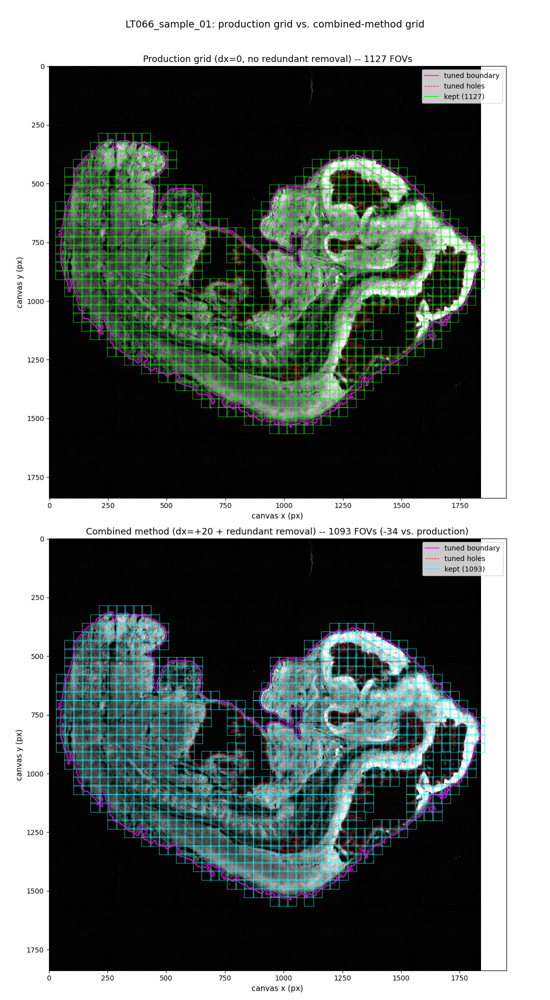

Saved: /n/holylfs05/LABS/zhuang_lab/Lab/shared/projects/lineage_tracing/experiments/LT066_sample_01/merfish/figures/MERci/tests/decrease_fov_number/combine_offset_and_redundant_removal/combine_offset_and_redundant_removal.production_vs_combined.png


In [9]:
fig, axes = plt.subplots(2, 1, figsize=(11, 20))
covered_vals = canvas.image[canvas.covered]

def _panel(ax, boundary, holes, coords, color, title):
    ax.imshow(canvas.image, cmap="gray",
              vmin=np.percentile(covered_vals, 1), vmax=np.percentile(covered_vals, 99))
    bx, by = um_to_px(*boundary.exterior.xy)
    ax.plot(bx, by, "-", color="magenta", lw=1.2, label="tuned boundary")
    for hole in holes:
        hx, hy = um_to_px(*hole.exterior.xy)
        ax.plot(hx, hy, "--", color="red", lw=0.8)
    ax.plot([], [], "--", color="red", lw=0.8, label="tuned holes")
    for x, y in coords:
        px, py = um_to_px(x, y)
        rect = plt.Rectangle((float(px) - half_px, float(py) - half_px), 2 * half_px, 2 * half_px,
                              fill=False, edgecolor=color, lw=0.5)
        ax.add_patch(rect)
    ax.plot([], [], "-", color=color, lw=1.2, label=f"kept ({len(coords)})")
    ax.legend(loc="upper right", fontsize=PLOT_LEGEND_FONTSIZE)
    ax.set_title(title, fontsize=PLOT_TITLE_FONTSIZE)
    ax.set_xlabel("canvas x (px)", fontsize=PLOT_LABEL_FONTSIZE)
    ax.set_ylabel("canvas y (px)", fontsize=PLOT_LABEL_FONTSIZE)
    ax.tick_params(labelsize=PLOT_TICK_FONTSIZE)

_panel(axes[0], tuned_boundary_polygon, tuned_hole_polygons, production_coords, "lime",
       f"Production grid (dx=0, no redundant removal) -- {len(production_coords)} FOVs")
_panel(axes[1], tuned_boundary_polygon, tuned_hole_polygons, combined_coords, "cyan",
       f"Combined method (dx={BEST_OFFSET_DX:+.0f} + redundant removal) -- {len(combined_coords)} FOVs "
       f"({len(combined_coords) - n_production:+d} vs. production)")

fig.suptitle("LT066_sample_01: production grid vs. combined-method grid",
             fontsize=PLOT_TITLE_FONTSIZE + 1)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(FIGURES_DIR / f"{NOTEBOOK_NAME}.production_vs_combined.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {FIGURES_DIR / (NOTEBOOK_NAME + '.production_vs_combined.png')}")

## 10 — Where does the offset grid's own redundant set sit?

Same style as notebook 04's own section 6 -- confirms the offset grid's
redundant FOVs sit in the same kind of place (narrow tips/corners of the
tissue edge), not somewhere that would suggest the offset shift and the
redundant-removal check are fighting each other.

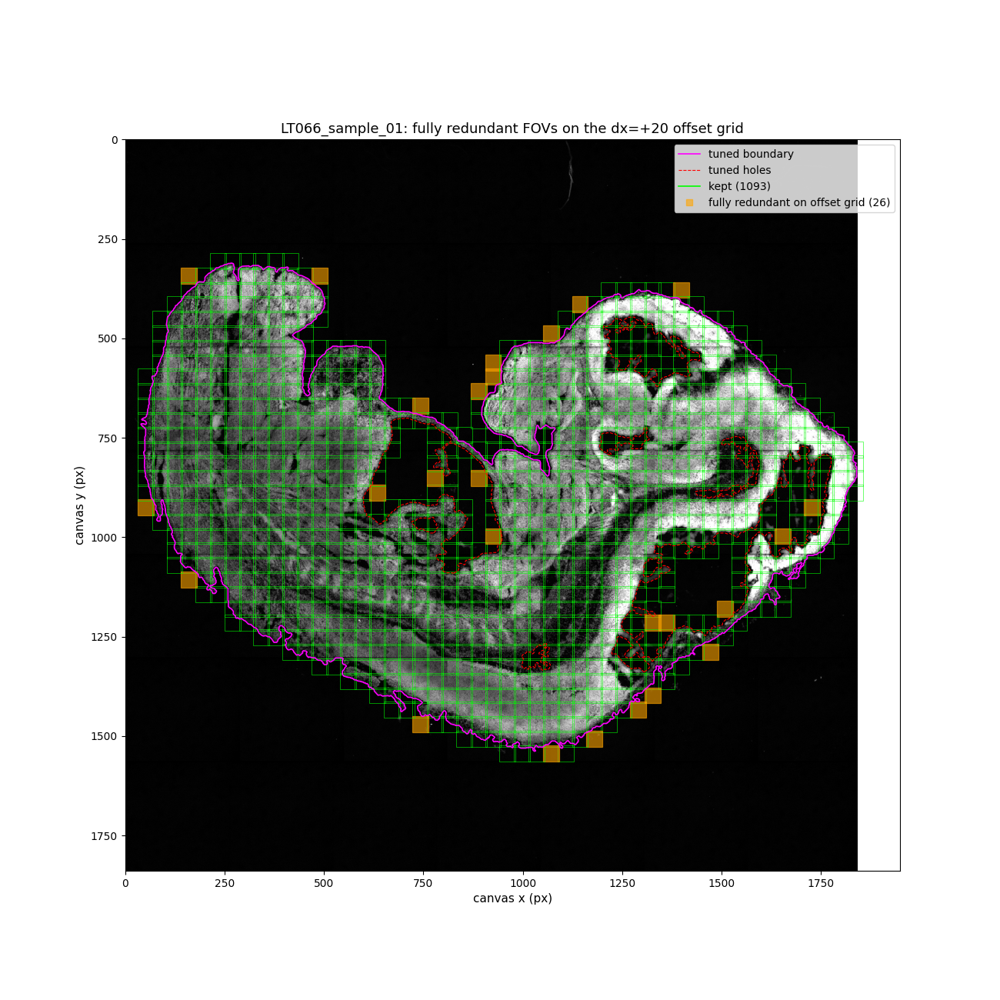

Saved: /n/holylfs05/LABS/zhuang_lab/Lab/shared/projects/lineage_tracing/experiments/LT066_sample_01/merfish/figures/MERci/tests/decrease_fov_number/combine_offset_and_redundant_removal/combine_offset_and_redundant_removal.redundant_on_offset_grid.png


In [10]:
fig, ax = plt.subplots(figsize=(13, 13))
ax.imshow(canvas.image, cmap="gray",
          vmin=np.percentile(covered_vals, 1), vmax=np.percentile(covered_vals, 99))

tbx, tby = um_to_px(*tuned_boundary_polygon.exterior.xy)
ax.plot(tbx, tby, "-", color="magenta", lw=1.2, label="tuned boundary")
for hole in tuned_hole_polygons:
    thx, thy = um_to_px(*hole.exterior.xy)
    ax.plot(thx, thy, "--", color="red", lw=0.8)
ax.plot([], [], "--", color="red", lw=0.8, label="tuned holes")

detected_set = set(offset_redundancy["detected"])
for fov_id, (x, y) in enumerate(offset_coords):
    px, py = um_to_px(x, y)
    is_redundant = fov_id in detected_set
    rect = plt.Rectangle((float(px) - half_px, float(py) - half_px), 2 * half_px, 2 * half_px,
                          fill=is_redundant, facecolor="orange" if is_redundant else None,
                          alpha=0.6 if is_redundant else 1.0,
                          edgecolor="orange" if is_redundant else "lime", lw=0.9 if is_redundant else 0.4)
    ax.add_patch(rect)

ax.plot([], [], "-", color="lime", lw=1.2, label=f"kept ({len(offset_coords) - len(detected_set)})")
ax.plot([], [], "s", color="orange", alpha=0.6, label=f"fully redundant on offset grid ({len(detected_set)})")
ax.legend(loc="upper right", fontsize=PLOT_LEGEND_FONTSIZE)
ax.set_title(f"LT066_sample_01: fully redundant FOVs on the dx={BEST_OFFSET_DX:+.0f} offset grid",
             fontsize=PLOT_TITLE_FONTSIZE)
ax.set_xlabel("canvas x (px)", fontsize=PLOT_LABEL_FONTSIZE)
ax.set_ylabel("canvas y (px)", fontsize=PLOT_LABEL_FONTSIZE)
ax.tick_params(labelsize=PLOT_TICK_FONTSIZE)
fig.savefig(FIGURES_DIR / f"{NOTEBOOK_NAME}.redundant_on_offset_grid.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {FIGURES_DIR / (NOTEBOOK_NAME + '.redundant_on_offset_grid.png')}")

## Takeaways

- **The two methods do NOT structurally conflict**: applying the offset shift
  first, then re-running the fully-redundant-FOV check on that shifted grid,
  still leaves the final uncovered tissue area at 0.0000 um^2 (below the 1
  um^2 noise floor) -- zero tissue coverage lost, verified directly, same as
  each method alone. Combining them is safe.
- **But they are not additive, and combining is actually worse than
  redundant-removal alone.** Offset-only: 1127 -> 1119 (-8). Redundant-removal-
  only: 1127 -> 1086 (-41). Naive addition would suggest -49; the actual
  combined result (offset then redundant-removal) is 1127 -> 1093 (-34) --
  smaller than redundant-removal alone, not bigger.
- **Why**: shifting the grid to `dx=+20` um changes *which* FOVs end up near
  each tissue tip. Some of production's 41 fully-redundant FOVs simply don't
  exist as separate grid points any more once the phase shifts (the offset
  itself already "merged away" that particular redundancy as part of its own
  -8 saving) -- but the shift also repositions the grid relative to other tips
  in a way that leaves fewer *remaining* FOVs there fully redundant (26 on the
  offset grid vs. 41 on the production grid). The two methods are drawing from
  a shared, overlapping pool of "wasted" FOVs at the tissue's tips/corners,
  not two independent sources of savings.
- **Practical conclusion for this experiment**: of the three options tested,
  redundant-FOV removal alone (`04_find_fully_redundant_fovs.ipynb`, -41,
  ~3.6%) gives the biggest verified-safe reduction -- bigger than the offset
  shift alone (-8) and bigger than combining both (-34). There is no reason to
  apply the `dx=+20` offset on top of redundant-FOV removal for this
  boundary/grid; it only recovers a subset of what redundant-removal alone
  already finds.
- No changes made to `acquisition/positions.py` or the production
  `02_create_boundary_from_mosaic.ipynb`/`02_create_positions_from_boundaries.ipynb`
  defaults -- still investigation only.

## 11 — Summary (filled in after execution)

In [11]:
print("Final comparison:")
print(comparison_df.to_string(index=False))
print(f"\nCombined-method net change vs. production: "
      f"{len(combined_coords) - n_production:+d} FOVs "
      f"({100 * (len(combined_coords) - n_production) / n_production:+.2f}%)")
print(f"Offset-only redundant set size: {len(offset_redundancy['detected'])} "
      f"(vs. production-grid redundant set size: {len(prod_redundancy['detected'])})")
print(f"Any mutually-redundant pairs kept back in either grid: "
      f"production={len(prod_redundancy['kept_but_flagged'])}, "
      f"offset={len(offset_redundancy['kept_but_flagged'])}")

Final comparison:
                                         grid  n_fovs  net_vs_production
      production (dx=0, no redundant removal)    1127                  0
                         offset only (dx=+20)    1119                 -8
                redundant removal only (dx=0)    1086                -41
combined: offset (dx=+20) + redundant removal    1093                -34

Combined-method net change vs. production: -34 FOVs (-3.02%)
Offset-only redundant set size: 26 (vs. production-grid redundant set size: 41)
Any mutually-redundant pairs kept back in either grid: production=0, offset=0
